In [1]:
import os
import cv2
import random
import pandas as pd
from matplotlib import pyplot as plt
import numpy as np
import itertools
from sklearn.cluster import MeanShift
from scipy.spatial.distance import cdist

In [2]:
from skimage import io
from skimage.transform import rotate
from skimage.color import rgb2gray
from deskew import determine_skew
from matplotlib import pyplot as plt

In [3]:
import warnings
warnings.filterwarnings('ignore')
cv2.setRNGSeed(0)

In [4]:
def preprocess_img(image,size=(1200,1600), return_inter=False):
    image = cv2.resize(image,size,interpolation = cv2.INTER_LINEAR)
    img = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    # thresh = cv2.threshold(img, 150, 255, cv2.THRESH_BINARY_INV)[1]
    thresh = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY,129,4)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5,5))
    opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel)
    result = 255 - opening

    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5,5))
    morph = cv2.morphologyEx(result, cv2.MORPH_CLOSE, kernel, iterations=1)
    mask = cv2.morphologyEx(morph, cv2.MORPH_OPEN, kernel, iterations=1)

    if return_inter:
        return [image, opening, result]
    return result, image

#generate_stats components into a dataframe
def generate_stats(totalLabels,stats, centroids):
    '''
    totalLabels,stats, centroids : cv2 connectedComponentsWithStats outputs
    '''
    columns = ['label_id', 'left','top','width','height','area','centroid_x','centroid_y']
    df = pd.DataFrame(columns=columns)
    df['label_id'] = [i for i in range(1,totalLabels+1)]
    df['left'] = stats[:,0]
    df['top'] = stats[:,1]
    df['width'] = stats[:,2]
    df['height'] = stats[:,3]
    df['area'] = stats[:,4]
    df['centroid_x'] = centroids[:,0]
    df['centroid_y'] = centroids[:,1]
    return df

#filter 
def filter_cv2_components(df, min_ar_thresh=1, max_ar_thresh=10,pixel_row_gap = 10):
    '''
    df : dataframe,
    min_ar_thresh : min aspect ratio threshold,
    max_ar_thresh : max aspect ratio threshold,
    pixel_row_gap : min gap b/w pixels to consider them in difft rows
    '''

    df['aspect_ratio'] = np.round(df['width']/df['height'],2)
    # df = df[(df['aspect_ratio'] > min_ar_thresh) & (df['aspect_ratio'] < max_ar_thresh)]  #filter by aspect-ratio
    # df = df[(df['area'] > min_area) & (df['area'] < max_area)]  #filter by area
    df = df.sort_values(by=['top', 'left']).reset_index(drop=True) #sort-by occurence
    
    #calculate rowID, colID
    df['rowID'] = 1
    row_id = 1
    prev_val = df.loc[0, 'top']
    for idx in range(1, df.shape[0]):
        curr_val = df.loc[idx, 'top']
        if curr_val - prev_val > pixel_row_gap:
            row_id += 1
        prev_val = curr_val
        df.at[idx, 'rowID'] = int(row_id)
    df['columnID'] = df.groupby('rowID')['left'].rank().astype(int)
    return df


In [6]:
def build_single_lexicon(label_id, df, k=5):
    '''
    label_id : word component id, 
    df : dataframe
    k : #neighbors to build context
    '''
    if label_id not in df['label_id'].values:
        print("unknown component")
        return
    
    #filter by current component and extract candidate neighbors
    x,y,w,h,r,c = df[df['label_id'] == label_id][['centroid_x','centroid_y','width','height','rowID','columnID']].values[0]
    r1 = (df['rowID'] >= r-1)
    r2 = (df['rowID'] <= r+1)    
    temp_df = df[r1 & r2]
    temp_df = temp_df[temp_df['label_id'] != label_id]
    
    #rotation-invariance - TBD during preprocessing
    
    #scale-invariance
    temp_df['new_centroid_x'] = (temp_df['centroid_x']-x)/w
    temp_df['new_centroid_y'] = (y-temp_df['centroid_y'])/h
    temp_df['new_left'] = (temp_df['left']-x)/w
    temp_df['new_top'] = (y-temp_df['top'])/h
    temp_df['new_width'] = temp_df['width']/w
    temp_df['new_height'] = temp_df['height']/h
    
    #calculate distance & angle
    temp_df['Euclidean'] = np.sqrt(temp_df['new_centroid_y']**2 + temp_df['new_centroid_x']**2)
    temp_df['theta'] = np.degrees(np.arctan2(temp_df['new_centroid_y'], temp_df['new_centroid_x']))
    temp_df['theta'] = (temp_df['theta'] + 360) % 360 
    temp_df.loc[temp_df['theta'] > 350, 'theta'] = 0 #heuristic
    temp_df.loc[temp_df['theta'] < 2, 'theta'] = 0 #heuristic
    temp_df['quadrant'] = pd.cut(temp_df['theta'], 8, labels=range(1,9))
    
    #sort and retreive top-K, format required coordinates.
    res_df = temp_df.sort_values(by=['Euclidean','theta'])[:k] #sort and get top-k neighbors
    res_df = res_df.sort_values(by=['theta'])
    res_df['tl_corner'] = res_df.apply(lambda row: (row['new_left'], row['new_top']), axis=1)
    res_df['br_corner'] = res_df.apply(lambda row: (row['new_left']+row['new_width'], row['new_top']+row['new_height']), axis=1)           
    return res_df


In [5]:
def plot_all_ouptuts(img):
    image, opening, thresh = preprocess_img(img,return_inter=True)
    totalLabels, labels, stats, centroid = cv2.connectedComponentsWithStats(thresh,4,cv2.CV_32S) # type: ignore #4 is for connectivity
    df = generate_stats(totalLabels,stats, centroid)
    df = filter_cv2_components(df)
    output = image.copy() 
    for comp in df['label_id'].values:
        x, y, w, h, area = df[df['label_id'] == comp][['left','top','width','height','area']].values[0]
        cv2.rectangle(output, (x, y), (x + w, y + h), (0, 255, 0), 2)
    
    fig, axs = plt.subplots(1, 4, figsize=(20, 6))
    axs[0].imshow(image)
    axs[0].set_title("image")
    axs[1].imshow(opening,cmap='gray')
    axs[1].set_title("opening")
    axs[2].imshow(thresh,cmap='gray')
    axs[2].set_title("thresh")
    axs[3].imshow(output)
    axs[3].set_title("components")
    plt.subplots_adjust(left=0, right=1, top=1, bottom=0, wspace=0.05, hspace=0.2)
    plt.show()

In [7]:
def build_context_layout(img,k_neigh = 5):
    '''
    img : image, 
    k_neigh : #neighbors to build context
    '''
    #preprocess and transform image
    thresh, img = preprocess_img(img)
    totalLabels, labels, stats, centroid = cv2.connectedComponentsWithStats(thresh,4,cv2.CV_32S)
    df = generate_stats(totalLabels,stats, centroid)
    df = filter_cv2_components(df)
    
    #extract context for each word component
    context_vectors,context_coordinates = [],[]
    for label in df.label_id.values:
        try:
            res = build_single_lexicon(label, df,k=k_neigh)
            if(res.shape[0] >= k_neigh):
                context_vectors.append(res[['tl_corner','br_corner']].values)
                coords = df[df['label_id'] == label][['centroid_x','centroid_y']].values
                context_coordinates.append(coords)
        except Exception as e:
            print(e)
    # format into a set of 4/quadrapules
    flattened_tuples = [np.array([item for sublist in t for item in sublist]) for t in context_vectors]
    array_of_tuples = np.array(flattened_tuples)
    context_vectors = array_of_tuples.reshape(len(context_vectors), k_neigh, 4) # 4 is for (Tl-x,TL-y,BR-x,BR-y )
    context_vectors = context_vectors.round(4)
    #print("total no of contexts extracted:",context_vectors.shape[0])
    return context_vectors,context_coordinates, img

In [8]:
class DocumentDetails():
    def __init__(self, img,feature_vectors,label_coordinates, img_path):
        self.img = img
        self.img_path = img_path
        self.feature_vectors = feature_vectors 
        self.label_coordinates = label_coordinates #saves each word coordinates indexed wrt to feature_vectors
        
class DocumentVectors():
    def __init__(self, img_folder_path):
        
        img_files = [file for file in os.listdir(img_folder_path) if file.endswith('.png')] #filter only image files
        img_file_paths = [os.path.join(img_folder_path, file_name) for file_name in img_files] #generate filepaths for all images
        
        #initialize variables
        self.img_file_paths = img_file_paths
        self.docs = {} #save all document details
        self.context_index = {} #save reduced context-vector-layouts index

    #for all images, extract context layouts.
    def extract_context_vectors(self):
        for id,img_path in enumerate(self.img_file_paths):
            img = cv2.imread(img_path)
            feature_vectors,label_coordinates, img = build_context_layout(img)
            print(img_path,id, img.shape, feature_vectors.shape,len(label_coordinates))
            self.docs[id] = DocumentDetails(img,feature_vectors,label_coordinates, img_path)
    
    #build index from extracted context layouts
    def build_context_index(self, ms=True, index_file_name='reduced_context_index.npy'):
        #if index already exists, load it. else build it and save.
        if os.path.exists(index_file_name):
            index = np.load(index_file_name,allow_pickle=True)
            self.context_index = dict(index.flatten()[0])
            print("loaded prebuilt index:",index_file_name,"in total:",len(self.context_index))
            return
        #build a normal index with ctxlayout->docid pairs
        index = {}
        for id in self.docs:
            cv_all = tuple(self.docs[id].feature_vectors)
            for cv in cv_all:
                index[tuple(list(cv.reshape(-1)))] = id
        print("extracted all context vectors, in total: ",len(index))

        if ms: #if ms is True, then perform Mean shift clustering to reduce index size
            #reduce cl collection with Mean shift clustering
            layouts = list(index.keys())
            clusterer = MeanShift()
            clusters = clusterer.fit(layouts) # type: ignore
            cluster_labels = clusters.labels_
            cluster_centers = clusters.cluster_centers_

            #build new reduced ctxlayout-centre->[list of doc-ids] index
            reduced_index = {}
            for i in range(0,len(cluster_labels)):
                cluster = cluster_labels[i]
                centroid = tuple(cluster_centers[cluster])
                doc = index[layouts[i]]
                if centroid in reduced_index:
                    reduced_index[centroid].add(doc)
                else:
                    reduced_index[centroid] = set([doc])

            self.context_index = reduced_index
            print("built mean-shift reduced-index, in total: ",len(reduced_index))
        else:
            self.context_index = index
            print("built full-index, in total: ",len(index))
        
        np.save(index_file_name, self.context_index)
        print("saved index, as ",index_file_name)

    #display all documents in the database
    def show_docs(self):
        for id in self.docs:
            img = self.docs[id].img
            plot_all_ouptuts(img)     

    #given query img, retreive relevant document

In [9]:
docs_path = './data/docs/'
dv = DocumentVectors(docs_path)
print(docs_path)

dv.extract_context_vectors()
dv.build_context_index()

./data/docs/
./data/docs/5.png 0 (1600, 1200, 3) (961, 5, 4) 961
./data/docs/18.png 1 (1600, 1200, 3) (505, 5, 4) 505
./data/docs/15.png 2 (1600, 1200, 3) (705, 5, 4) 705
./data/docs/10.png 3 (1600, 1200, 3) (438, 5, 4) 438
./data/docs/13.png 4 (1600, 1200, 3) (948, 5, 4) 948
./data/docs/14.png 5 (1600, 1200, 3) (343, 5, 4) 343
./data/docs/11.png 6 (1600, 1200, 3) (901, 5, 4) 901
./data/docs/2.png 7 (1600, 1200, 3) (829, 5, 4) 829
./data/docs/19.png 8 (1600, 1200, 3) (334, 5, 4) 334
./data/docs/3.png 9 (1600, 1200, 3) (1023, 5, 4) 1023
./data/docs/20.png 10 (1600, 1200, 3) (716, 5, 4) 716
./data/docs/4.png 11 (1600, 1200, 3) (360, 5, 4) 360
./data/docs/1.png 12 (1600, 1200, 3) (875, 5, 4) 875
./data/docs/9.png 13 (1600, 1200, 3) (793, 5, 4) 793
./data/docs/16.png 14 (1600, 1200, 3) (888, 5, 4) 888
./data/docs/31.png 15 (1600, 1200, 3) (777, 5, 4) 777
./data/docs/17.png 16 (1600, 1200, 3) (526, 5, 4) 526
./data/docs/7.png 17 (1600, 1200, 3) (399, 5, 4) 399
./data/docs/8.png 18 (1600, 12

In [ ]:
dv.show_docs()

In [15]:
def random_quarter_crop(img):
    img_width, img_height,_ = img.shape
    max_left = img_width - img_width // 2
    max_top = img_height - img_height // 2
    left = random.randint(0, max_left)
    top = random.randint(0, max_top)
    crop_width = img_width // 2
    crop_height = img_height // 2
    cropped_img = img[left:left + crop_width, top:top + crop_height]
    return cropped_img

./data/docs/14.png


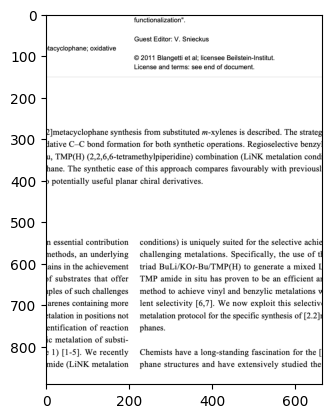

In [16]:
docs_path = './data/docs/'
img_id = 14
img_path = docs_path + str(img_id) + '.png'
print(img_path)
img = cv2.imread(img_path)
img_c = random_quarter_crop(img)
plt.imshow(img_c)

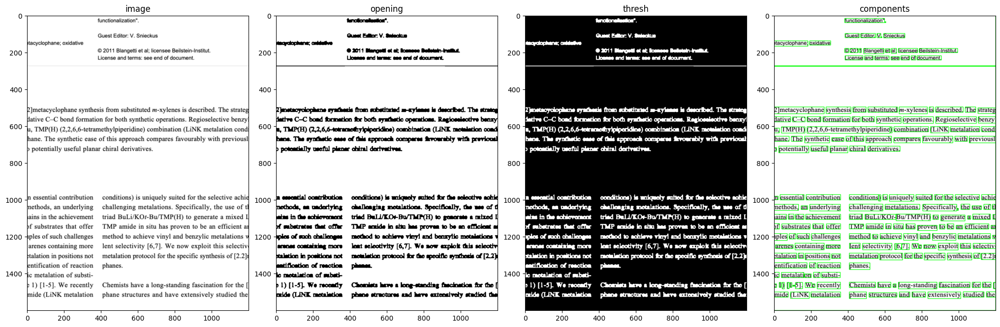

In [17]:
plot_all_ouptuts(img_c)

In [18]:
def custom_plot_matches2(q, d, m1, m2):
        ''' 
        q: query image,
        d: document image, 
        m1: matched point-set of query ,
        m2: matched point-set of document,
        '''
        point_img = np.full((d.shape[0],d.shape[1]*2,3),255) #draw and image of 2* doc-image
        point_img[:q.shape[0],:q.shape[1],:] = q #fill top-left with query
        point_img[:d.shape[0],d.shape[1]:,:] = d #fill top-right with document
        point_img = point_img.astype('uint8')

        output_image = point_img.copy()
        for match1, match2 in zip(m1, m2):
            #difference between a match should be in range of (mean_centroid-threshold, mean_centroid+threshold)
            (x1, y1) = match1
            (x2, y2) = match2
            x2 = x2+d.shape[1]
            color = (0, 255, 0)
            cv2.circle(output_image, (int(x1),int(y1)), radius=8, color=color, thickness=5)
            cv2.circle(output_image, (int(x2),int(y2)), radius=8, color=color, thickness=5)
            cv2.line(output_image, (int(x1), int(y1)), (int(x2), int(y2)), color, 2)
        
        plt.title('point-matches')
        plt.imshow(output_image)
        plt.show()

def custom_plot_matches(q, d, m1, m2):
        ''' 
        q: query image,
        d: document image, 
        m1: matched point-set of query ,
        m2: matched point-set of document,
        '''
        point_img = np.full((d.shape[0],d.shape[1]*2,3),255) #draw and image of 2* doc-image
        point_img[:q.shape[0],:q.shape[1],:] = q #fill top-left with query
        point_img[:d.shape[0],d.shape[1]:,:] = d #fill top-right with document
        point_img = point_img.astype('uint8')

        points = abs(m2-m1) #distribution of differences between matched coordinate pairs
        mean_centroid = np.mean(points, axis=0) #mean centroid coordinate difference
        threshold = np.std(points, axis=0) # threshold - std deviation of difference
        
        output_image = point_img.copy()
        for match1, match2 in zip(m1, m2):
            #difference between a match should be in range of (mean_centroid-threshold, mean_centroid+threshold)
            diff = np.round(abs(match2-match1)) 
            c1 = np.all(diff > mean_centroid-threshold)
            c2 = np.all(diff < mean_centroid+threshold)
            (x1, y1) = match1
            (x2, y2) = match2
            x2 = x2+d.shape[1]
            color = (0, 255, 0)
            if(c1 and c2):
                color = (0, 255, 0)
            else:
                color = (255, 0, 0)
            cv2.circle(output_image, (int(x1),int(y1)), radius=8, color=color, thickness=5)
            cv2.circle(output_image, (int(x2),int(y2)), radius=8, color=color, thickness=5)
            cv2.line(output_image, (int(x1), int(y1)), (int(x2), int(y2)), color, 2)

        plt.title('point-matches')
        plt.imshow(output_image)
        plt.show()


def point_match(query_img,doc_id,n_matches=30):
        '''
        query_img: query img,
        id : doc-id
        '''
        #build context-layout for query_img
        query_vectors,query_coordinates,img = build_context_layout(query_img)
        doc_vectors,doc_coordinates,doc_img = [],[], None

        #extract context-layout(actual, not reduced index) for doc=id
        for id in dv.docs:
            if(id == doc_id):
                doc_vectors,doc_coordinates,doc_img = dv.docs[id].feature_vectors,dv.docs[id].label_coordinates,dv.docs[id].img
                break

        #for each query vector, find nearest match of context-vector,
        #and then extract corresponding coordinate pairs from query & doc
        matches1,matches2 = [],[]
        for i in range(len(query_vectors)):
            #get min-distance corresponding context layout
            dist = np.linalg.norm(doc_vectors - query_vectors[i, np.newaxis, :, :], axis=(1, 2))
            closest_index = np.argmin(dist)
            query_coords = query_coordinates[i]
            doc_coords = doc_coordinates[closest_index]
            #append matches to return
            matches1.append(query_coords[0])
            matches2.append(doc_coords[0])
            if len(matches1) >= n_matches:
                break
        # custom_plot_matches(query_img,doc_img,np.round(matches1,2),np.round(matches2,2))
        custom_plot_matches(img,doc_img,np.round(matches1,2),np.round(matches2,2))
            

In [19]:
#get orientation for a point set.
def get_orientation(matrix):
   '''
   matrix : numpy 2d array
   '''
   determinant = np.linalg.det(matrix)
   orientation = np.sign(determinant) 
   return orientation

#match/verify orientation for 2 point sets.
def verfiy_orientation(P1,P2):
    '''
    P1 : numpy 2d array,
    P2 : numpy 2d array,
    '''
    s1 = get_orientation(P1)
    s2 = get_orientation(P2)
    verif = s1 * s2
    return int(verif)

#triplet-verification
def verification(candidates, query_vectors, query_coordinates, m_matches=30):
        '''
        candidates: candidate doc-id's,
        query_coordinates: geometric coordinates of word components in query img,
        m_matches : no of matched pairs to consider for  verification
        '''
        triplet_scores= {}
        query_coordinates = np.array(query_coordinates).reshape(len(query_coordinates),2).round(2)
        curr_score = -1
        curr_matches = None
        res_path = None
        #for each candidate doc, build triplet score
        for cd in candidates:  
            dc,doc_vectors, path = dv.docs[cd].label_coordinates, dv.docs[cd].feature_vectors, dv.docs[cd].img_path
            doc_coords = np.array(dc).reshape(len(dc),2).round(2)
            doc_vectors = np.array(doc_vectors).reshape(len(doc_vectors),20).round(2)
            #extract pair-wise distances for each cooridinate pair from query, candidate
            distances = np.round(cdist(query_vectors, doc_vectors, metric='euclidean'),2) 
            #build a graph of cooridinate pair from query, candidate with edge-length as distance between them
            edges_dict = {(tuple(query_coordinates[i]), tuple(doc_coords[j])): distances[i, j] for i in range(query_coordinates.shape[0]) for j in range(doc_coords.shape[0])}
            #sort the graph by min edge lengths and extract the matched coordiante pairs from query, candidate
            min_edges = sorted(edges_dict.items(), key=lambda x: x[1])
            # print(distances.shape, query_vectors.shape,doc_vectors.shape )

            #extract top m_matches of point-sets of matched items from query, candidate and verify for 1-1 correspondence
            triplets,count = [],1
            p1_set,p2_set = set(),set()
            for edge in min_edges:
                P1,P2,d = edge[0][0],edge[0][1], edge[1]
                if(P1 not in p1_set) and (P2 not in p2_set):
                    p1_set.add(P1)
                    p2_set.add(P2)
                    triplets.append((P1,P2))
                    count += 1
                if count >= m_matches:
                    break
            
            #build triplet sets of top m_matches of pairs.
            triplet_combinations = np.array(list(itertools.combinations(triplets, 3)))
            #extract  matche scores for each triplet combination and sum up to make final score
            matches_score = 0
            #for each triplet coordinate-sets, verfiy orientation
            for elm in triplet_combinations:
                s1 = np.concatenate([elm[:,0,:], np.ones((elm[:,0,:].shape[0], 1))], axis=1) #2,3 => 3,3 matrix
                s2 = np.concatenate([elm[:,1,:], np.ones((elm[:,1,:].shape[0], 1))], axis=1) #2,3 => 3,3 matrix
                matches_score += verfiy_orientation(s1,s2) #
            triplet_scores[cd] = matches_score # final triplet matches score for candidate cd
            if(matches_score > curr_score):
                 curr_score = matches_score
                 curr_matches = triplets
                 res_path = path


        print("triplet verification scores:",sorted(triplet_scores.items(), key=lambda x:x[1], reverse=True))

        #sort by matches scores and return top-one.
        results = sorted(triplet_scores, key=triplet_scores.get, reverse=True)
        print("top triplet-score candidates:", results)
        print("final retreived result document ID:", results[0])
        return results[0], curr_matches, res_path
    
    #verify 1-1 point match between a query img and a given doc-id


In [20]:
def query(query_img, max_candidates=10,min_qry_vectors=10):
        '''
        query_img: query img,
        max_candidates: no of candidates for triplet verification
        '''
        #get query-img context layouts
        query_vectors,query_coordinates,img = build_context_layout(query_img)
        # if len(query_vectors)<min_qry_vectors: #return if <10 query vectors found
        #     print("found only",len(query_vectors),"query vectors. cannot query with this img")
        #     return
        print("found",len(query_vectors),"query vectors")
        query_vectors = query_vectors.reshape(len(query_vectors),20)

        #get matchings-count score
        index = np.array(list(dv.context_index.keys()))
        docs = np.array(list(dv.context_index.values()))
        coverage_scores = {}
        distances = cdist(query_vectors, index) #extract distances between each pair of index-vectors,query-vectors 
        best_match_indices = np.argmin(distances, axis=1) #filter best matches of pairs
        print(best_match_indices,query_vectors.shape, index.shape)
        for bm in best_match_indices: #build coverage scores(no of matched index-vectors) for each document.
            for elm in set(docs[bm]):
                if elm in coverage_scores:
                    coverage_scores[elm] += 1
                else:
                    coverage_scores[elm] = 0
        print("layout coverage scores:",sorted(coverage_scores.items(), key=lambda x:x[1],reverse=True))

        #sort by matchings-count/coverage scores & filter top max_candidates
        candidates = sorted(coverage_scores, key=coverage_scores.get, reverse=True)#[:max_candidates]
        print("top layout-match candidates : ", candidates)
        doc_id, matches, doc_path = verification(candidates, query_vectors, query_coordinates)
        matches = np.array(matches)
        m1 = matches[:,0,:]
        m2 = matches[:,1,:]
        print(doc_path)
        
        # point_match(query_img, doc_id)
        doc_img = dv.docs[doc_id].img
        custom_plot_matches2(img,doc_img,np.round(m1,2),np.round(m2,2))


ground truth:  14


found 195 query vectors
[155   0   0   0   0 463 381   0   0  38   0 126   0   0   0   0   0   0
   0   0   0   0   0   0 474   0   0   0   0   0 277   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0 239  49   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0 322   0   0   0
  23   0   0   0   0   0   0 295 321   0   0   0   0   0   0   0  51  90
   0 401   0   0   0   0   0   0   0   0  78  48   0  29   0   0   0   0
   0   0   0   0   0   0   0   0   0   0 213   0   0   0   0   0   0   0
   0   0   0   0 256   0   0   0   0   0   0 277   0   0   0 317   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0  15   0 242   7
   0  38  36   5 171   0   0   0   0   0   0   0   0   0   0] (195, 20) (562, 20)
layout coverage scores: [(12, 177), (2, 175), (9, 175), (15, 174), (4, 173), (0, 172), (7, 172), (10, 172), (18, 172), (3, 171), (6, 171), (8, 171), (11, 171), (19,

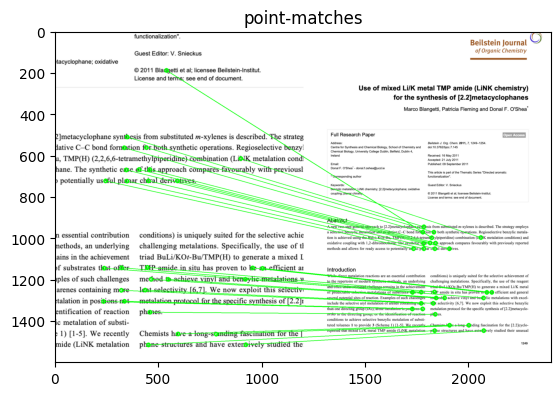

In [21]:
print("ground truth: ", img_id)
query(img_c)

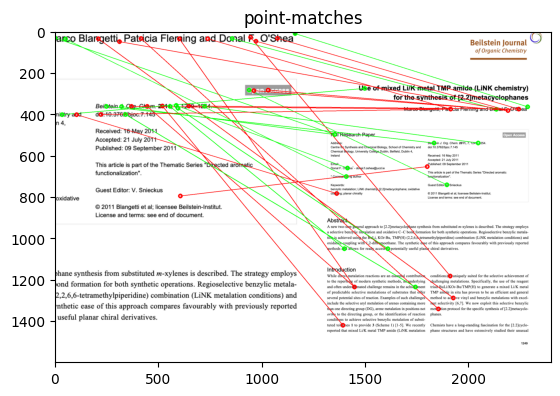

In [19]:
point_match(img_c, 5)

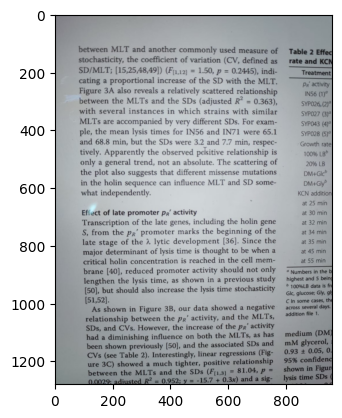

In [11]:
q2 = cv2.imread("./data/queries/2.jpeg")
plt.imshow(q2)

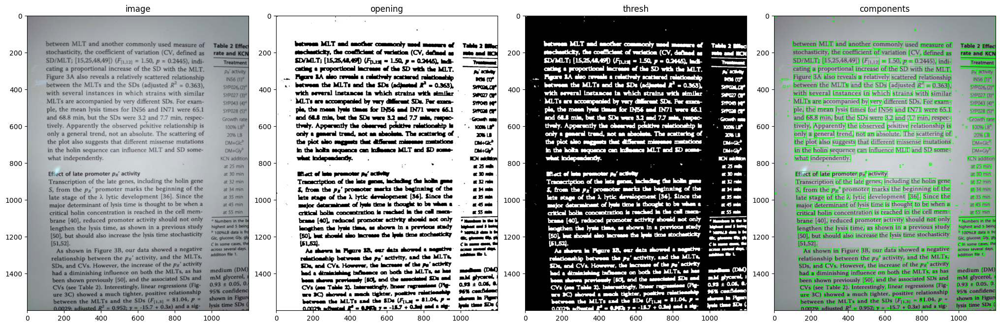

In [12]:
plot_all_ouptuts(q2)

ground truth:  1
found 509 query vectors
[  0 317 495 548 315 325 227 305 503  91 368 495 208 420   0   0   0   0
   0   0   0   0   0   0  29   0   0   0   0   0   0   0   0   0   0   0
   0 413 188   0   0   0   0   0   0   0   0   0  15   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0  87   0 317   0 556   0   0
   0   0   0   0   0  20   0   0   0 170 465   0 197   0   0   0   0   0
   0   0   0   0   0  86  33   0   0 515  90   0   0   0   0 558   0   0
   0   0   0  32 275   0   0   0   0   0   0   0 110   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0 420 547 307 317
   0   0   0   0   0   0   0   0 531   0   0   0   0   0   0   0 174   0
   0   0   0   0   0   0   0 397   0  10 256   0   0   0   0   0   0   0
   0  10   0  70   0 419 326 109 122  41   0   0   0   0   0 273   0   0
   0   0   0   0 109   0 156   0   0   0   0   0   0   0 329 479 371 495
   0 547   0 512 547   0 531 123   0 115   0   0   0   0   0  77 469   0
 545   0  

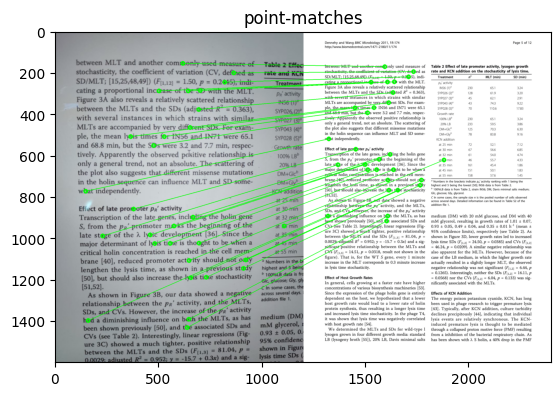

In [22]:
print("ground truth: ", 1)
query(q2)

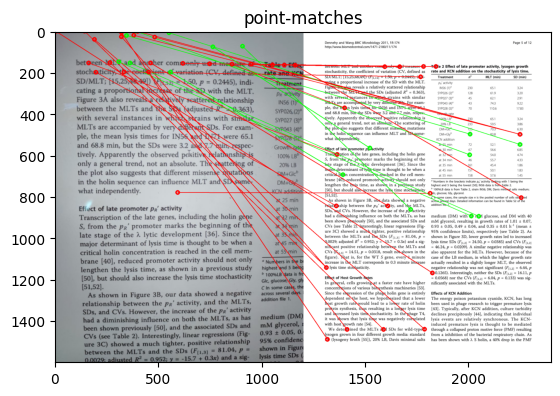

In [23]:
point_match(q2, 12)

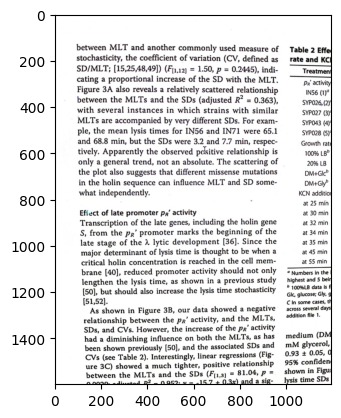

In [24]:
q12 = cv2.imread("./../../data/queries/2_CS.jpeg")
plt.imshow(q12)

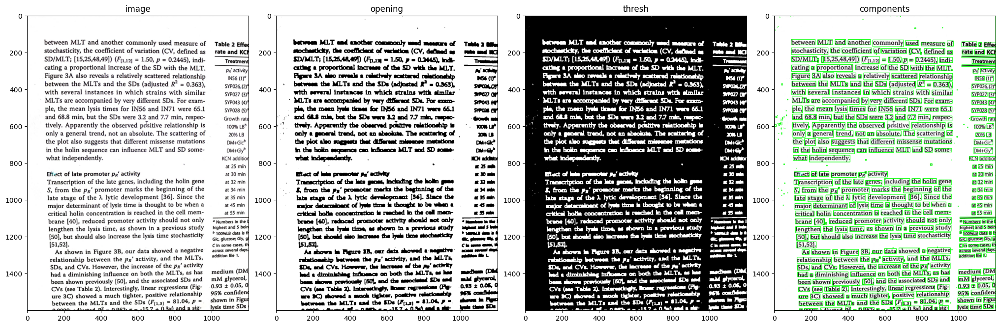

In [25]:
plot_all_ouptuts(q12)

ground truth:  1
found 520 query vectors
[  0 317 495 273 469 548 548 194 369 549 317 317 553 420 317 317   0   0
   0   0 213   0   0   0   0   0   0  24   0   0   0   0  66   0   0   0
   0   0   0   0 413 188   0 292   0   0   0   0   0   0   0 267   0   3
   0   0   0   0   0   0   0   0   0   0   0   0   0  71 497   0   0 381
   0   0   0   0   0   0   0 126   0   0   0   0   0   0   0   0   0   0
   0 242   0 365 110  33   0   0   0   0   0 558   0   0   0   0   0  78
   0   0   0   0   0   0   0 110   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0  41 238 420   0   0   0   0   0   0   0
   0   0   0 134   0 444   0   0  97 364   0 168 408   0 420  79   0 306
 237   0   0   0   0   0   0   0   0 401  28   0   0 197   0   0 256 484
 176 146 102 293   0   0   0   0   0   0   0   0  10   0 308   0  71 176
 419   0   0   0  41   0 317   0   0   0   0 273 175   0   0   0   0   0
   0 109   0 156   0   0   0   0   0   0   0  47 549 525 495 333 343 233
 273 495 3

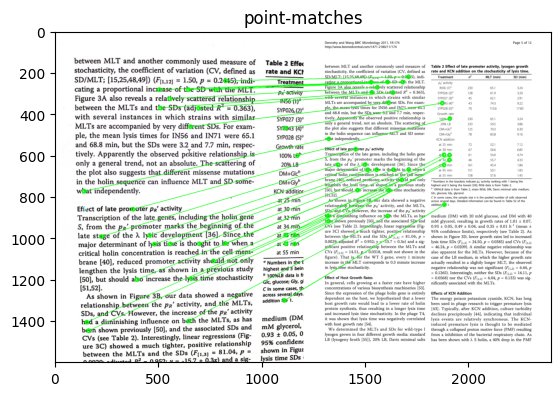

In [26]:
print("ground truth: ", 1)
query(q12)

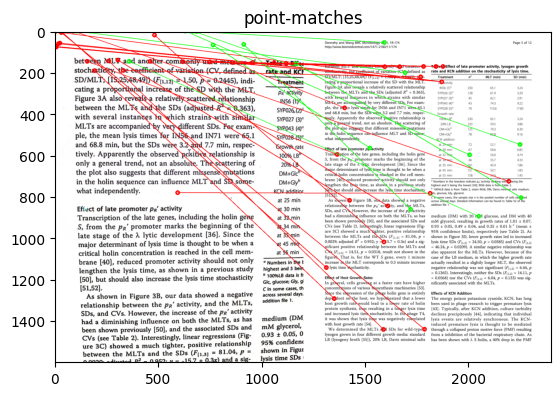

In [27]:
point_match(q12, 12)

In [28]:
def extract_ROI(image):
    
    gray = cv2.cvtColor(image.copy(), cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (3, 3), 0)
    thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

    # Remove horizontal lines
    horizontal_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (25,1))
    detected_lines = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, horizontal_kernel, iterations=1)
    cnts = cv2.findContours(detected_lines, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = cnts[0] if len(cnts) == 2 else cnts[1]
    for c in cnts:
        cv2.drawContours(thresh, [c], -1, 0, -1)

    # Dilate to merge into a single contour
    vertical_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (2,30))
    dilate = cv2.dilate(thresh, vertical_kernel, iterations=3)

    # Find contours, sort for largest contour and extract ROI
    cnts, _ = cv2.findContours(dilate, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[-2:]
    cnts = sorted(cnts, key=cv2.contourArea, reverse=True)[:-1]
    for c in cnts:
        x,y,w,h = cv2.boundingRect(c)
        # cv2.rectangle(image, (x, y), (x + w, y + h), (36,255,12), 4)
        ROI = image[y:y+h, x:x+w]
        break
    return ROI
# plt.imshow(extract_ROI(q4))

def deskew(image):
    grayscale = rgb2gray(image)
    angle = determine_skew(grayscale)
    print("angle:", angle)
    rotated = (rotate(image, angle, resize=True) * 255).astype(np.uint8)
    return rotated
# plt.imshow(deskew(extract_ROI(q4)))

def normalize_image(image, target_width=600, target_height=800):
    original_height, original_width = image.shape[:2]
    scale_x = target_width / original_width
    scale_y = target_height / original_height
    scaled_image = cv2.resize(image, (target_width, target_height))
    return scaled_image
# plt.imshow(normalize_image(q4))

def preprocess2(img):
    img = extract_ROI(img)
    img = deskew(img)
    img= normalize_image(img)
    return img

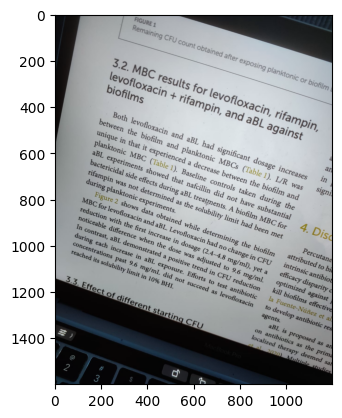

In [17]:
q3 = cv2.imread('./data/queries/cam_cap.jpeg')
plt.imshow(q3)

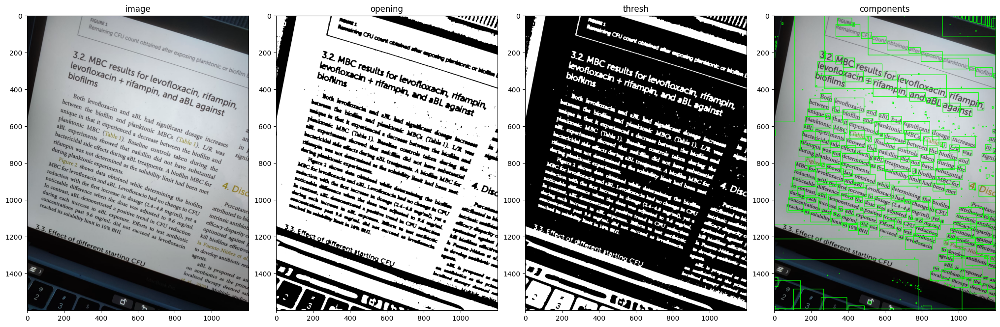

In [18]:
plot_all_ouptuts(q3)

ground truth:  10
found 407 query vectors
[  0 156   0   0 403   0 502  68   0   0 259 259 259   0  57   0   0   0
   0   0 495 549 368   0 509 227 548 124 230 227 495 495 130   0  41 196
 429 429 236 429 349 120 549  75  75 255   0 227   0   0   0 151 319   0
 113   0   0 430 238 553 547 444 110 496 364 110 558   0   0  78 298   0
 180 502 282 155   0 304   0   0   0  48  63  86  48   0   0 215 530 186
 170 530  48   0 170 362 193   0   0   0   0 356   0 282 180 505   0   0
 172   0   0 182   0   0 189  63 132   0 304   0  48   0   0 215   0 532
  99   0 368 238   0  48  42 361 167  86 355 197   0 132   0  76   0   0
   0   0 304  23 392   0 147 123 558 361 359   0   0   0 293   0 215   0
   0   0   0 340 188   0   0   0 212   0   0   0   0 212   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0  33  70   0   0   0   0 388  48   0   0   0   0  76   0   0   0
 437 226   0   0 282 362   0  64   0   0   0 304   0   0 197   0 427   0
   0   0 

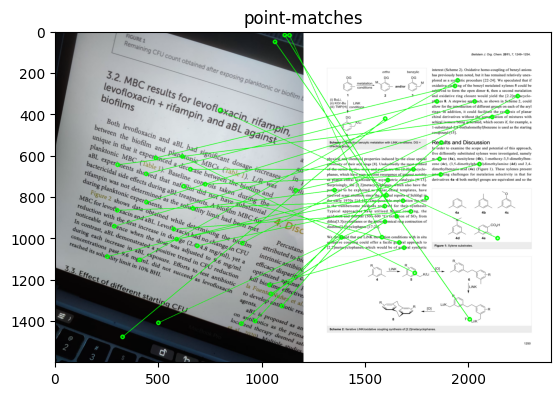

In [30]:
print("ground truth: ", 10)
query(q3)

angle: 19.0


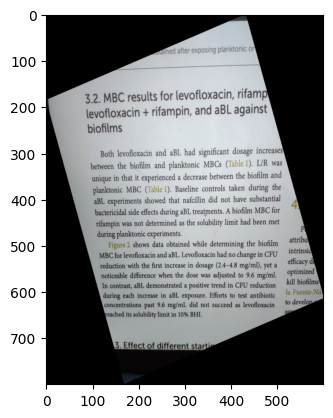

In [32]:
q33 = preprocess2(q3)
plt.imshow(q33)

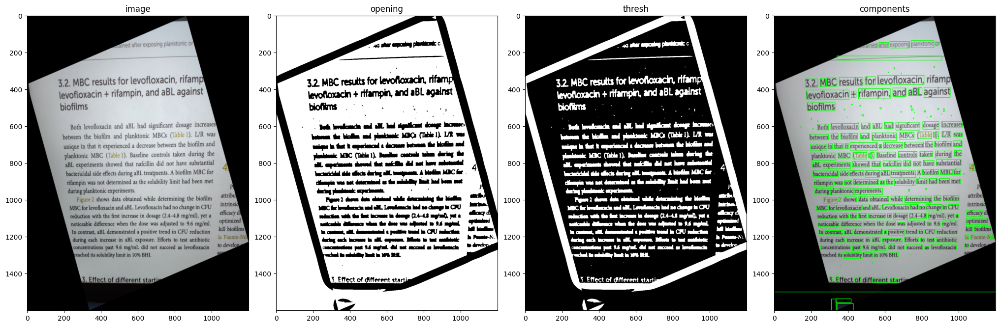

In [33]:
plot_all_ouptuts(q33)

ground truth:  10
found 227 query vectors
[  0   0   0   0 551   0 130 360 273 419  47   0   0   0   0  67   0   0
 120   7   0   0  10   0  10 197   0 444 279 351 366  59  98 497 437 366
 437 340 419  44 558 545   1 283 419 303 546 420   0   0 230   0   0   0
   0   0   0 110 283   0   0   0 277   0   0   0   0   0   0   0   0   0
   0   0   0   0   0  36   0   0  50   0   0   0   0   0   0   0   0   0
  25   0   0   0   0   0   0   0   0   0  56   0   0   0   0   0   0   0
   0   0   0 330 155   0   0   0   0   0   0   0   0   0  43   0   0   0
   0 283 394 227   0   0   0   0   0   0   0   0 115 227   0   0   0   0
  41 126   0   0 326 122  72   0   0   0   0   0   0  72 124   0   0   0
  73   0   0   0 109   0   0   0   0 126  77   0   0  92   0   0   0   0
   0   0   0  49   0 292   1   0 380 372   0   0   0   0   0   0   0   0
   0   0  10   0   0   0   0   0   0   0   0  34   0   0   0 108   0   0
 509 525 420  52  49 120   0 408 551  71   0] (227, 20) (562, 20)
layout coverage 

triplet verification scores: [(3, 3626), (19, 190), (4, 188), (13, 170), (18, 156), (11, 74), (12, 52), (5, 40), (20, 34), (15, 30), (0, 14), (17, 4), (1, -8), (16, -18), (6, -32), (8, -54), (2, -74), (7, -102), (14, -108), (10, -118), (9, -176)]
top triplet-score candidates: [3, 19, 4, 13, 18, 11, 12, 5, 20, 15, 0, 17, 1, 16, 6, 8, 2, 7, 14, 10, 9]
final retreived result document ID: 3
./../../data/docs/10.png


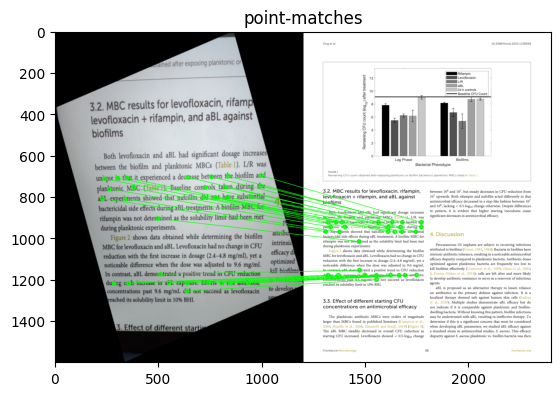

In [36]:
print("ground truth: ", 10)
query(q33)

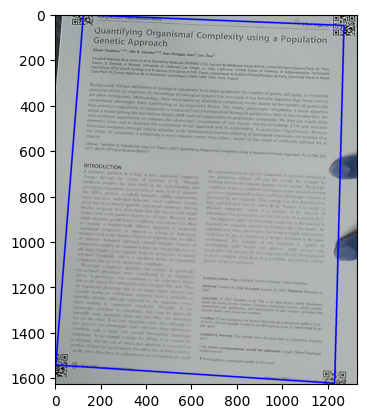

In [19]:
query_44 = cv2.imread(".//data/queries/query_31.png")
plt.imshow(query_44)

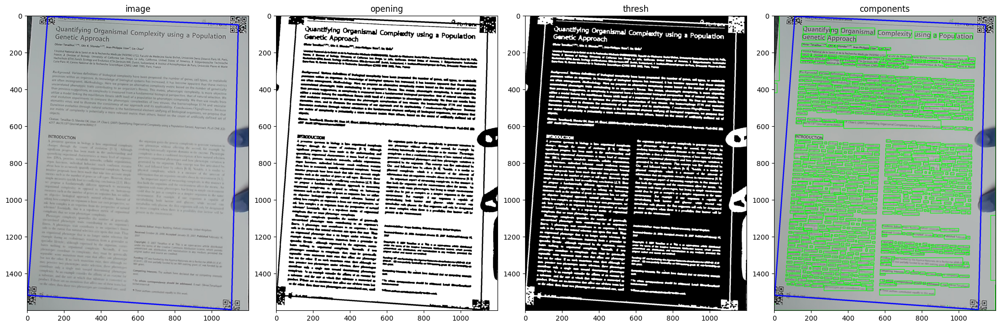

In [20]:
plot_all_ouptuts(query_44)

ground truth:  31
found 803 query vectors
[208   0   0  59   0   0   0   0 460   0   0   0  86 448   0 435   0  15
 166 175   0   0  95   0  29   0   0   0   0 412   0   0   0   0  59  79
   0   0   0   0   0   0 441   0   0  20   0   0   0   0   0   0 292   0
   0   0   0   0   0   0   0 188   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0 508   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0 244   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0 413   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
  17   0   0   0   0   0   0   0   0  10   0   0   0   0  10   0   0   0
  90   0   0   0   0   0   0   0   0   0   0   0   0   0   7   0   0   0
   0   0 

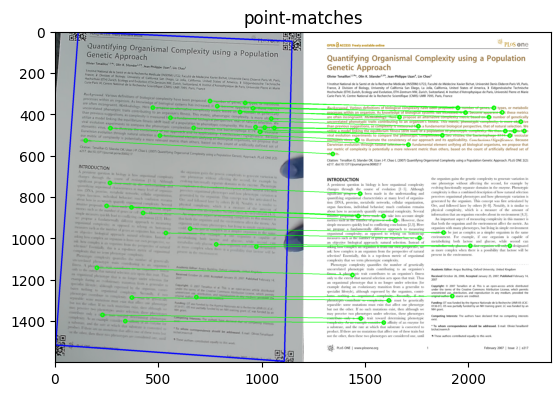

In [38]:
print("ground truth: ", 31)
query(query_44)

angle: 3.0000000000000044


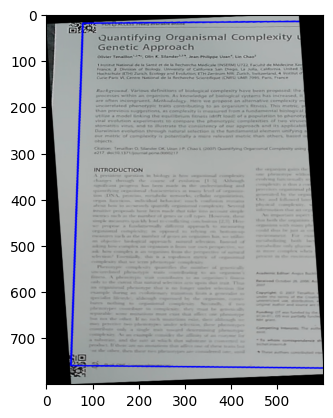

In [39]:
q44 = preprocess2(query_44)
plt.imshow(q44)

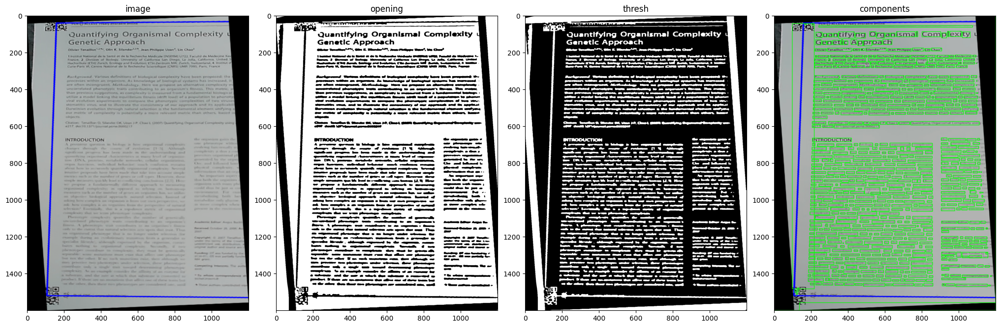

In [40]:
plot_all_ouptuts(q44)

ground truth:  31


found 676 query vectors
[314 130 314   0 458   0 158   0   0   0   0  41   0   0   0   0   0  22
   0   0   0   0 163   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0  50   0   0   0   0   0  78
  91   0   0  26   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   1   0   0   0   0 319   0   0   0  10   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0 275   0   0
   0   0   0   0   0   0   0   0   0 380   0   0   0   0   0   0  68   0
   0   0 433   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0  43   0   0   0  20 297   0   0   0   0   0   0   0   0   0   0   0
   0  31  36 545   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0  90 115   0   0   0   0
   0   0   0   0   0   0   0  68   0   0   1   0   0  78   0   0   0   0
  37   0   0   0   0   0  2

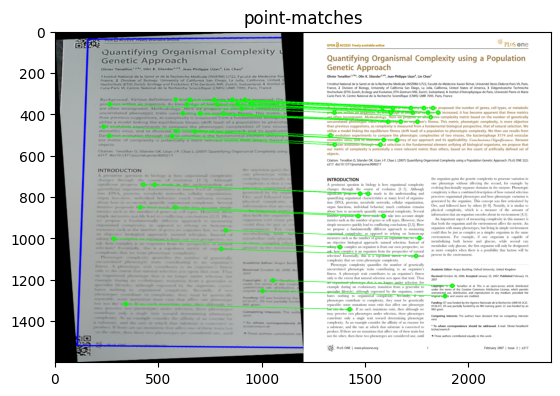

In [41]:
print("ground truth: ", 31)
query(q44)

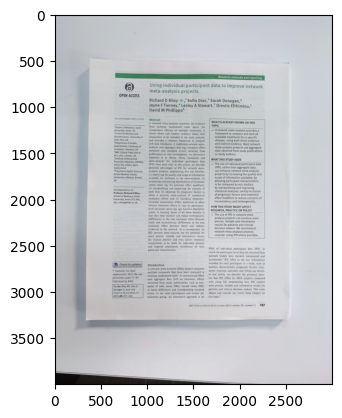

In [23]:
query_5 = cv2.imread("./data/queries/d1.jpg")
plt.imshow(query_5)

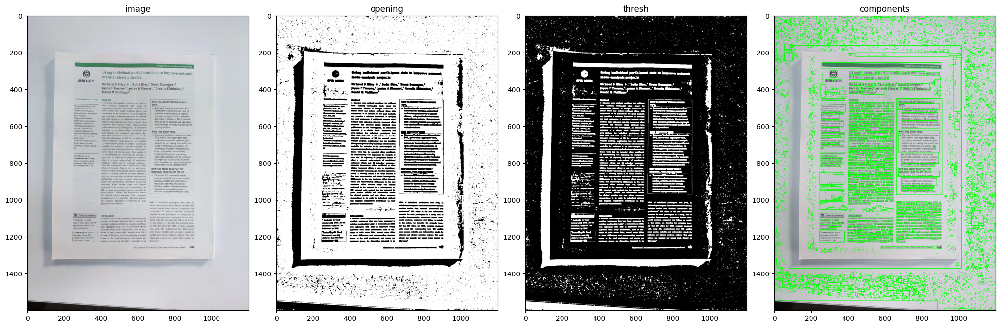

In [24]:
plot_all_ouptuts(query_5)

ground truth:  31
found 8130 query vectors
[  0   0 356 ... 245 245 400] (8130, 20) (562, 20)
layout coverage scores: [(12, 3528), (1, 3055), (2, 2996), (7, 2750), (8, 2566), (15, 2560), (3, 2448), (10, 2429), (11, 2369), (19, 2356), (18, 2327), (13, 2231), (9, 2192), (4, 2094), (16, 2093), (6, 2079), (20, 2067), (0, 2055), (14, 2040), (17, 1950), (5, 1749)]
top layout-match candidates :  [12, 1, 2, 7, 8, 15, 3, 10, 11, 19, 18, 13, 9, 4, 16, 6, 20, 0, 14, 17, 5]
triplet verification scores: [(5, 324), (4, 152), (18, 90), (7, 78), (20, 42), (12, 20), (9, 20), (14, 20), (2, -2), (0, -4), (17, -20), (1, -22), (8, -26), (3, -28), (13, -30), (6, -32), (15, -40), (19, -78), (11, -106), (16, -136), (10, -202)]
top triplet-score candidates: [5, 4, 18, 7, 20, 12, 9, 14, 2, 0, 17, 1, 8, 3, 13, 6, 15, 19, 11, 16, 10]
final retreived result document ID: 5
./data/docs/14.png


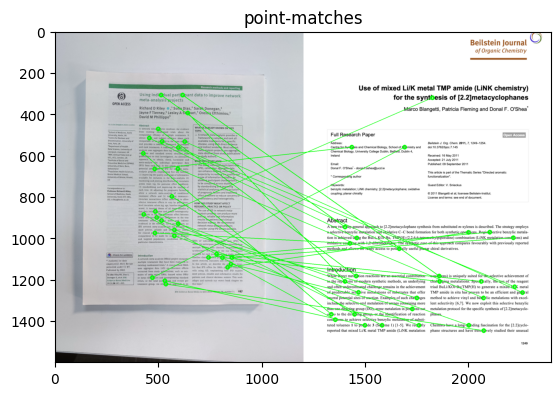

In [26]:
print("ground truth: ", None)
query(query_5)

angle: 0.0


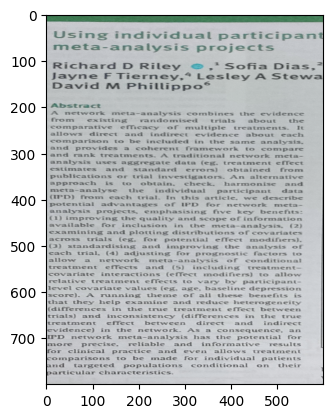

In [30]:
q55 = preprocess2(query_5)
plt.imshow(q55)

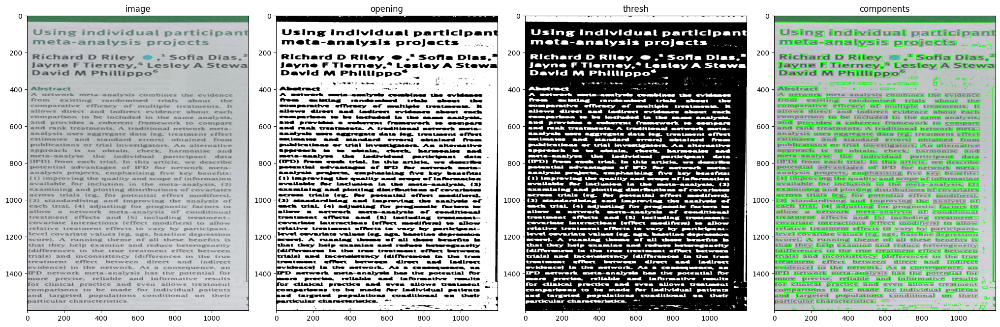

In [31]:
plot_all_ouptuts(q55)

ground truth:  None
found 715 query vectors
[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0 546
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0 355 106 473  59  24 444
  42   0   0  97 161 364 489   0 422 281  16 215 532 245 532 212   0 115
   0   0   0   0   0   0   0   0   0   0   0   0   0   0 196   0   0   0
   0   0   0   0   0   0   0   0  76   0   0   0  41   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0 213
   0   0   0   0   0   0   0   0   0   0   0   0 553 553 275 382   0  97
 368  48 377  78 553  49  24  24 465   0   0 284 362 503 369   0 297 368
  51 145 133 304 168   0 558   0  48   0 547   0   0   0   0   0   0   0
 238 215 244  41 238   0   0   0   0 178 547 336 390 230 435 169   0  79
 166 133 385   0 503  98 559 285 215 293 282 390 411 146 559 268 138 141
 532 146   0   0 303 532   0 448 171  94 308 308 303 532 243 532 251 525
 381 30

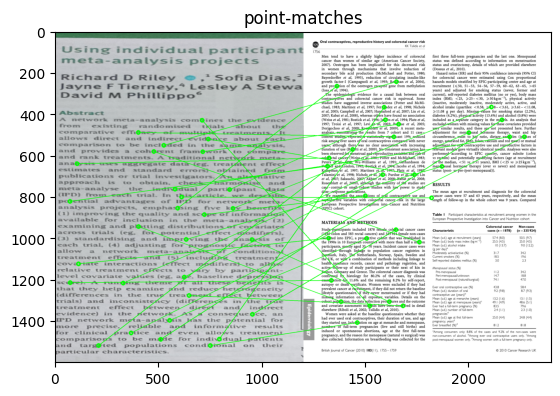

In [32]:
print("ground truth: ", None)
query(q55)